In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
from PIL import Image
import time
import torch.nn as nn
# %matplotlib inline
import os
import torch
from torch.autograd import Variable
dtype = torch.cuda.FloatTensor


In [16]:
img = 'justin.png'
mask = 'justin_mask.png'

In [17]:
def preprocess_input(img, mask):
    img = Image.open(img)
    plt.imshow(img)
    mask = Image.open(mask)
    plt.figure()
    plt.imshow(mask,cmap='gray')
    img = np.array(img).transpose(2,0,1)
    img = img[:3,:512,:512]/255
    mask = np.array(mask)[None, :]/255
    processed_img = img*mask
    plt.figure()
    plt.imshow(processed_img.transpose(1,2,0))
    img = (torch.from_numpy(img)[None,:]).type(dtype)
    mask = (torch.from_numpy(mask)[None,:]).type(dtype)
    processed_img = (torch.from_numpy(processed_img)[None,:]).type(dtype)
    return img, mask, processed_img 

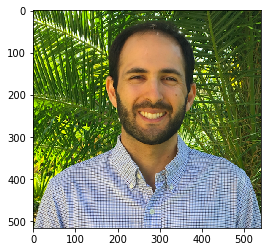

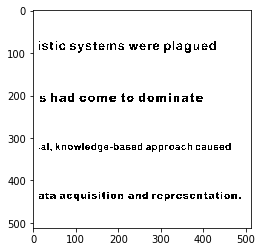

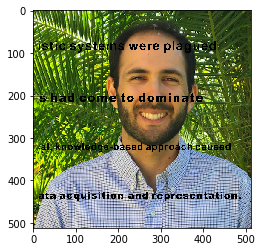

In [18]:
img, mask, processed_img = preprocess_input(img, mask)

In [9]:
def fill_noise(x, noise_type):
    """Fills tensor `x` with noise of type `noise_type`."""
    if noise_type == 'u':
        x.uniform_()
    elif noise_type == 'n':
        x.normal_() 
    else:
        assert False
def get_noise(input_depth, method, spatial_size, noise_type='u', var=1./10):
    """Returns a pytorch.Tensor of size (1 x `input_depth` x `spatial_size[0]` x `spatial_size[1]`) 
    initialized in a specific way.
    Args:
        input_depth: number of channels in the tensor
        method: `noise` for fillting tensor with noise; `meshgrid` for np.meshgrid
        spatial_size: spatial size of the tensor to initialize
        noise_type: 'u' for uniform; 'n' for normal
        var: a factor, a noise will be multiplicated by. Basically it is standard deviation scaler. 
    """
    if isinstance(spatial_size, int):
        spatial_size = (spatial_size, spatial_size)
    if method == 'noise':
        shape = [1, input_depth, spatial_size[0], spatial_size[1]]
        net_input = torch.zeros(shape)
        
        fill_noise(net_input, noise_type)
        net_input *= var            
    elif method == 'meshgrid': 
        assert input_depth == 2
        X, Y = np.meshgrid(np.arange(0, spatial_size[1])/float(spatial_size[1]-1), np.arange(0, spatial_size[0])/float(spatial_size[0]-1))
        meshgrid = np.concatenate([X[None,:], Y[None,:]])
        net_input=  np_to_torch(meshgrid)
    else:
        assert False
        
    return net_input

def get_params(opt_over, net, net_input, downsampler=None):
    '''Returns parameters that we want to optimize over.
    Args:
        opt_over: comma separated list, e.g. "net,input" or "net"
        net: network
        net_input: torch.Tensor that stores input `z`
    '''
    opt_over_list = opt_over.split(',')
    params = []
    
    for opt in opt_over_list:
    
        if opt == 'net':
            params += [x for x in net.parameters() ]
        elif  opt=='down':
            assert downsampler is not None
            params = [x for x in downsampler.parameters()]
        elif opt == 'input':
            net_input.requires_grad = True
            params += [net_input]
        else:
            assert False, 'what is it?'
            
    return params

In [13]:
def add_module(self, module):
    self.add_module(str(len(self) + 1), module)
    
torch.nn.Module.add = add_module


class Concat(nn.Module):
    def __init__(self, dim, skip, deeper):
        super(Concat, self).__init__()
        self.dim = dim
        self.layer1 = skip
        self.layer2 = deeper
    def forward(self, input):
        inputs = []
        inputs.append(self.layer1(input))
        inputs.append(self.layer2(input))
        return torch.cat(inputs, dim=self.dim)

def act(activation_method = 'LeakyReLU'):
    if activation_method=='ReLU':
        return nn.ReLU()
    elif activation_method =='LeakyReLU':
        return nn.LeakyReLU()
    elif activation_method=='sigmoid':
        return nn.Sigmoid()
    else:
        return nn.Tanh()

def conv(in_f, out_f, kernel_size, stride=1): 
    res = []
    res.append(nn.ReflectionPad2d(int((kernel_size - 1) / 2)))
    res.append(nn.Conv2d(in_f, out_f, kernel_size, stride, padding=0))
    return nn.Sequential(*res)

def skip(c_in, c_out, c_down, c_up, c_skip, k_down, k_up, k_skip, upsample_mode, act_fun, ):
    model = nn.Sequential()
    model_tmp = model
    input_depth = c_in
    for i in range(len(c_down)):
        temp_layers = []
        temp_layers.append(nn.ReflectionPad2d(int((k_down - 1) / 2)))
        temp_layers.append(nn.Conv2d(input_depth, c_down[i], k_down, 2))
        temp_layers.append(nn.BatchNorm2d(c_down[i]))
        temp_layers.append(nn.LeakyReLU())
        
        temp_layers.append(nn.ReflectionPad2d(int((k_down - 1) / 2)))
        temp_layers.append(nn.Conv2d(c_down[i], c_down[i], k_down, 1))
        temp_layers.append(nn.BatchNorm2d(c_down[i]))
        temp_layers.append(nn.LeakyReLU())
        deeper_main = nn.Sequential()
        
        if i < len(c_down)-1:
            temp_layers.append(deeper_main)
            temp_layers.append(nn.Upsample(scale_factor=2, mode=upsample_mode))
            if c_skip[i] != 0:
                skip_layers = []
                skip_layers.append(conv(input_depth, c_skip[i], k_skip))
                skip_layers.append(nn.BatchNorm2d(c_skip[i]))
                skip_layers.append(act(act_fun))
                model_tmp.add(Concat(1, nn.Sequential(*skip_layers), nn.Sequential(*temp_layers)))
            else:
                model_tmp.add(nn.Sequential(*temp_layers))
            model_tmp.add(nn.BatchNorm2d(c_skip[i] + c_up[i + 1] ))
            model_tmp.add(conv(c_skip[i] + c_up[i + 1], c_up[i], k_up, 1))
            
        else:#last layer
            temp_layers.append(nn.Upsample(scale_factor=2, mode=upsample_mode))
            if c_skip[i] != 0:
                skip_layers = []
                skip_layers.append(conv(input_depth, c_skip[i], k_skip))
                skip_layers.append(nn.BatchNorm2d(c_skip[i]))
                skip_layers.append(act(act_fun))
                model_tmp.add(Concat(1, nn.Sequential(*skip_layers), nn.Sequential(*temp_layers)))
            else:
                model_tmp.add(nn.Sequential(*temp_layers))
            model_tmp.add(nn.BatchNorm2d(c_skip[i] +c_down[i]))
            model_tmp.add(conv(c_skip[i] + c_down[i], c_up[i], k_up, 1))

        model_tmp.add(nn.BatchNorm2d(c_up[i]))
        model_tmp.add(act(act_fun))
        model_tmp.add(conv(c_up[i], c_up[i], 1))
        model_tmp.add(nn.BatchNorm2d(c_up[i]))
        model_tmp.add(act(act_fun))
        input_depth = c_down[i]
        model_tmp = deeper_main

    model.add(conv(c_up[0], c_out, 1))
    model.add(nn.ReLU())

    return model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00000  Loss 0.178172


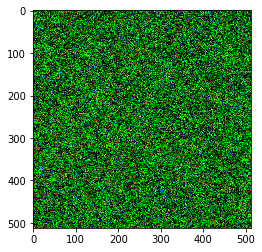

Iteration 00100  Loss 0.022123


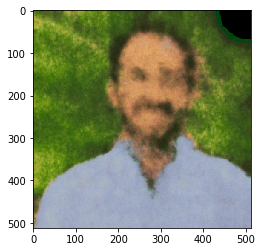

Iteration 00200  Loss 0.017156


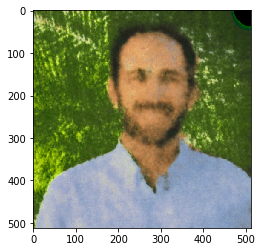

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00300  Loss 0.013887


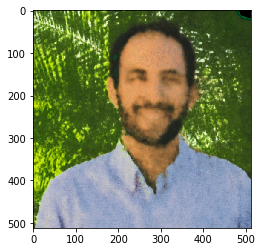

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00400  Loss 0.011901


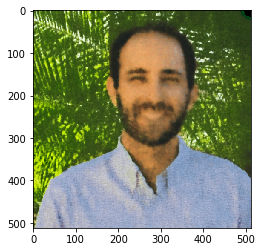

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00500  Loss 0.010508


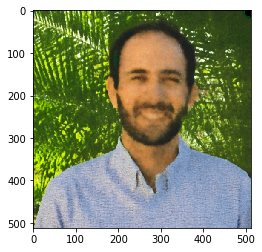

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00600  Loss 0.009332


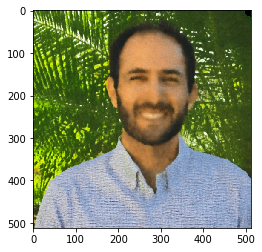

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00700  Loss 0.008009


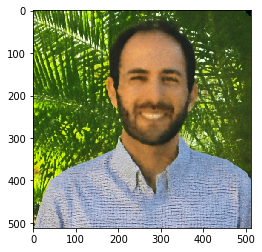

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00800  Loss 0.006874


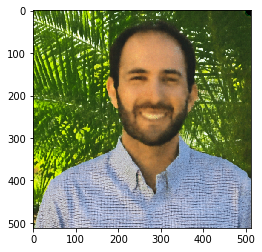

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 00900  Loss 0.005898


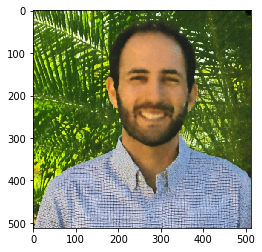

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01000  Loss 0.004937


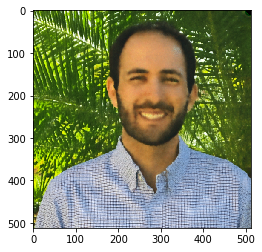

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01100  Loss 0.004268


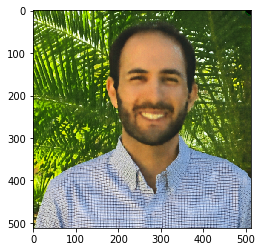

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01200  Loss 0.003701


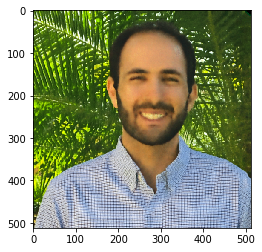

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01300  Loss 0.003275


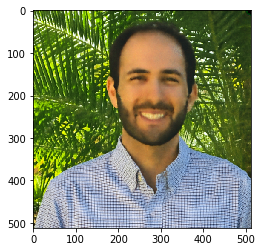

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01400  Loss 0.002862


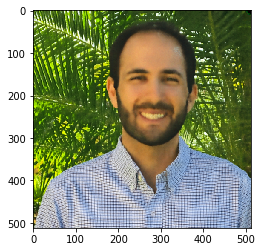

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01500  Loss 0.002605


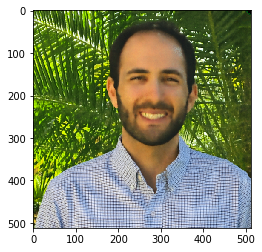

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01600  Loss 0.002278


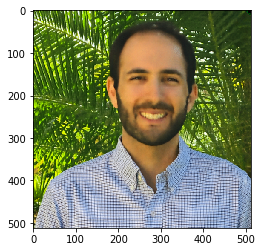

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01700  Loss 0.002068


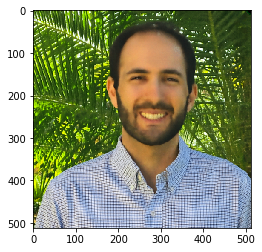

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 01800  Loss 0.001910


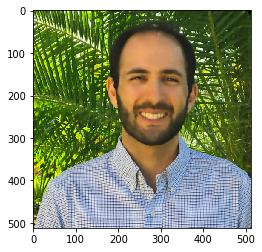

Iteration 01900  Loss 0.014664


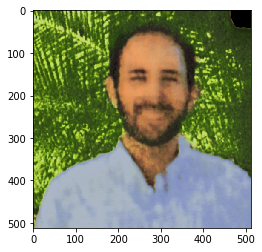

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02000  Loss 0.008215


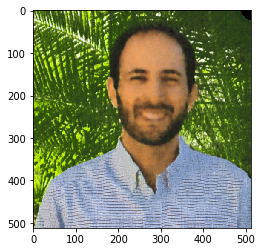

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02100  Loss 0.006158


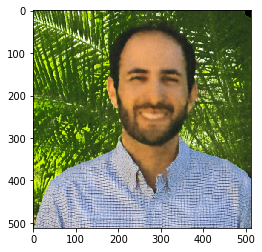

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02200  Loss 0.004980


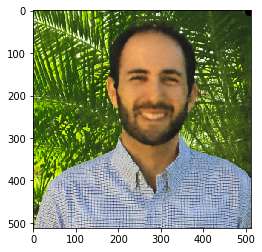

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02300  Loss 0.004122


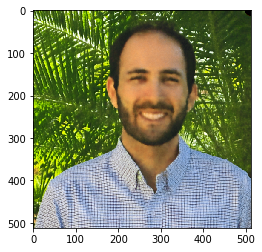

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02400  Loss 0.003578


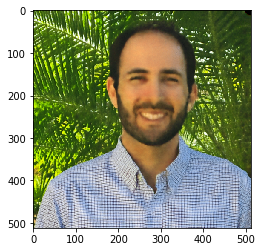

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02500  Loss 0.003304


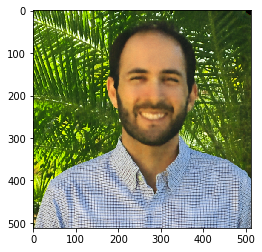

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02600  Loss 0.002913


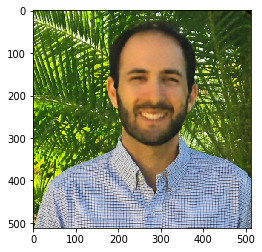

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02700  Loss 0.002628


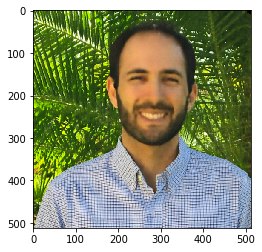

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02800  Loss 0.002444


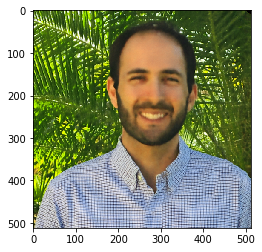

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 02900  Loss 0.002182


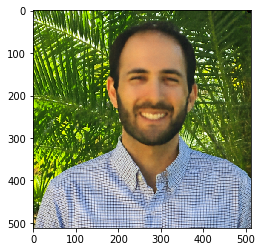

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03000  Loss 0.002021


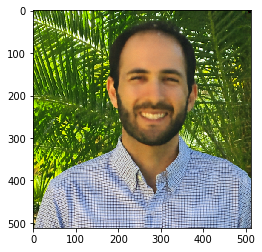

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03100  Loss 0.001909


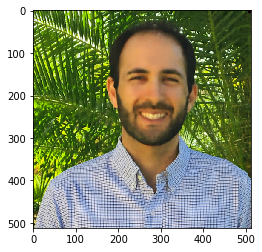

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03200  Loss 0.001769


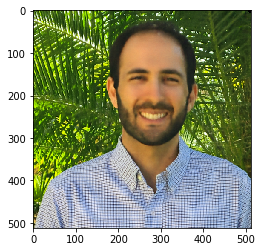

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03300  Loss 0.001670


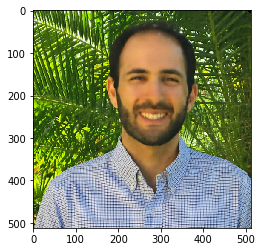

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03400  Loss 0.001570


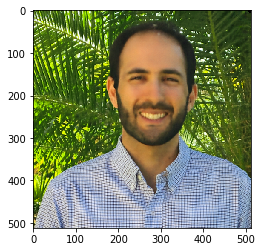

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03500  Loss 0.001459


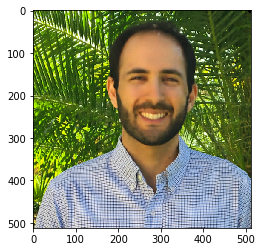

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03600  Loss 0.001362


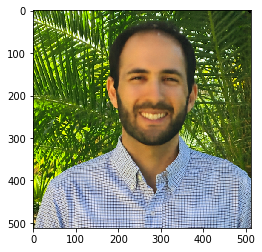

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03700  Loss 0.001284


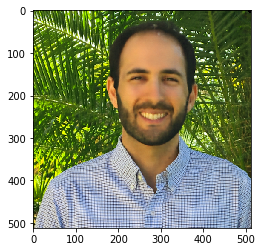

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03800  Loss 0.001236


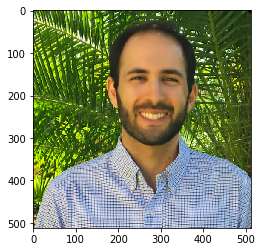

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 03900  Loss 0.001223


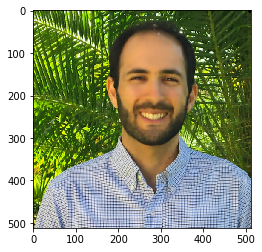

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04000  Loss 0.001058


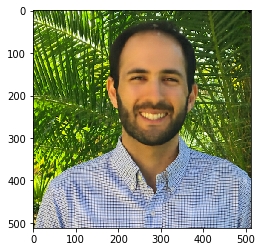

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04100  Loss 0.001088


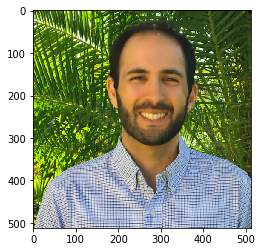

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04200  Loss 0.000976


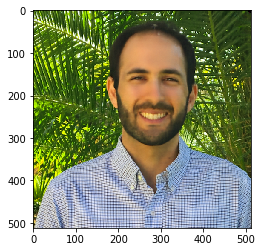

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04300  Loss 0.000916


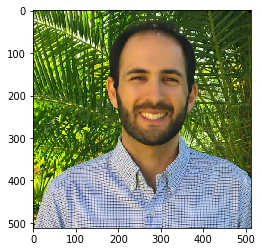

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04400  Loss 0.000942


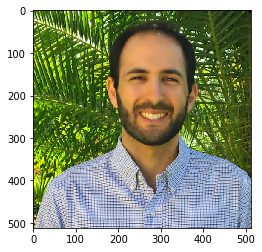

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04500  Loss 0.000868


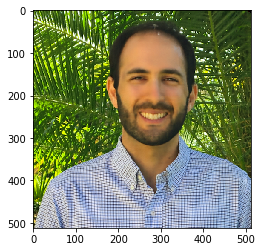

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04600  Loss 0.000790


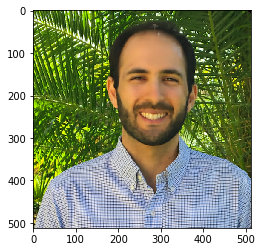

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04700  Loss 0.000767


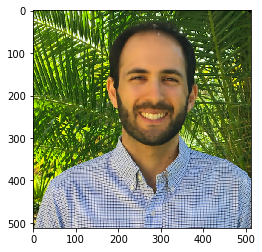

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04800  Loss 0.000770


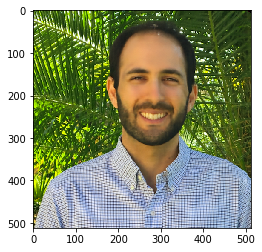

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 04900  Loss 0.000676


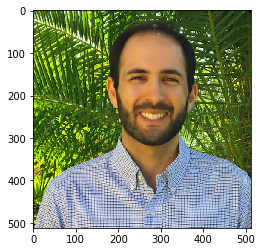

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 05000  Loss 0.000671


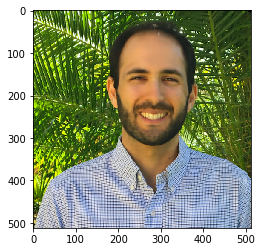

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 05100  Loss 0.005321


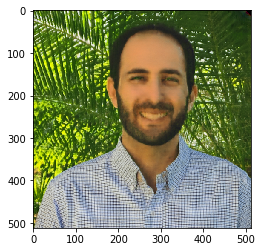

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 05200  Loss 0.000924


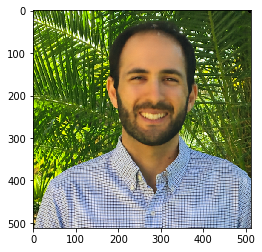

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 05300  Loss 0.000726


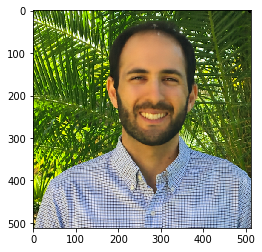

KeyboardInterrupt: 

In [14]:
INPUT = 'noise'
input_depth = 32
LR = 0.01 
num_iter = 6001
param_noise = False
show_every = 50
figsize = 5
reg_noise_std = 0.03
pad = 'reflection'
OPT_OVER = 'net'

model = skip(input_depth, img.shape[1], 
               c_down = [128] * 5,
               c_up =   [128] * 5,
               c_skip =    [128] * 5,  
               k_up = 3, k_down = 3, 
               upsample_mode='nearest', k_skip=1,
               act_fun='LeakyReLU').type(dtype)

model = model.type(dtype)


mse = torch.nn.MSELoss().type(dtype)
net_input = get_noise(input_depth, INPUT, img.shape[2:]).type(dtype)
noise = net_input.detach().clone()
net_input_saved = net_input.detach().clone()
# print(img.shape, img.shape[1:])
parameters = get_params(OPT_OVER, model, net_input)
optimizer = torch.optim.Adam(parameters, lr=LR)

for i in range(num_iter):
    optimizer.zero_grad()
    
    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
#     print(net_input.shape)
    out = model(net_input)
#     print(out.shape)
    loss = mse(out * mask, img * mask)
    loss.backward()
    
    optimizer.step()
        
    if i % 100 == 0:
        print('Iteration %05d  Loss %f' % (i, loss.item()))
        out = out.detach().cpu().numpy()[0]
#         print(out.shape)
        plt.figure()
        plt.imshow(out.transpose(1,2,0))
        plt.show()

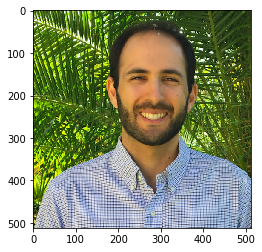

In [100]:
# out = out.detach().cpu().numpy()[0]
#         print(out.shape)
plt.figure()
plt.imshow(out.transpose(1,2,0))
plt.show()

In [99]:
out

array([[[0.4364723 , 0.39813858, 0.294058  , ..., 0.19524267,
         0.22878443, 0.2764255 ],
        [0.43503538, 0.41771385, 0.31807885, ..., 0.22642319,
         0.25850695, 0.2924814 ],
        [0.45321554, 0.42458296, 0.3408797 , ..., 0.26119092,
         0.28026122, 0.30196974],
        ...,
        [0.2133691 , 0.49692553, 0.76061237, ..., 0.55932474,
         0.24032584, 0.3884079 ],
        [0.21369214, 0.2550507 , 0.4916399 , ..., 0.34173024,
         0.2799811 , 0.46340135],
        [0.27714375, 0.27275428, 0.41250598, ..., 0.5522148 ,
         0.55092764, 0.52588177]],

       [[0.6329701 , 0.56745064, 0.4258143 , ..., 0.22859849,
         0.2586562 , 0.29561505],
        [0.6269148 , 0.5987992 , 0.4628505 , ..., 0.25802985,
         0.28899497, 0.3144218 ],
        [0.64848727, 0.6148955 , 0.506007  , ..., 0.2863836 ,
         0.30771923, 0.3264705 ],
        ...,
        [0.29891115, 0.5588253 , 0.78218514, ..., 0.57135546,
         0.23707432, 0.41867253],
        [0.2